# Introduction

Helpful sources we referenced for data, syntax, and visualizations support:

https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb
* Much of our syntax for visualizations (notably map visualizations) came from here
* The article corresponding to this notebook (https://towardsdatascience.com/which-countries-are-affected-the-most-by-covid-19-4d4570852e31) inspired our COVID-19 case study

https://www.analyticsvidhya.com/blog/2019/10/gaussian-mixture-models-clustering/
* Provided helpful syntax on running K-means and GMM using sk-learn

https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_time_series
* All the data we used was stored in this repository

# Cleaning and Structuring Data

In [1]:
# # Uncomment and run to install the necessary packages
!pip install tslearn
!pip install vincent
!pip install geopy

     |████████████████████████████████| 790 kB 24.8 MB/s 
     |████████████████████████████████| 2.0 MB 52.9 MB/s 
     |████████████████████████████████| 3.4 MB 65.7 MB/s 
     |████████████████████████████████| 25.3 MB 61.3 MB/s 
  Created wheel for vincent: filename=vincent-0.4.4-py3-none-any.whl size=35167 sha256=f13af326efec98addf6feb8bb3153424dad57a0d277c65ac9aee8a2cfb173ea7
  Stored in directory: /root/.cache/pip/wheels/8a/82/70/830a62b316859479b700063f828a1e13fcdc403dd89dcbeca2
Successfully built vincent
     |████████████████████████████████| 112 kB 18.2 MB/s 


In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
import matplotlib.colors as colors
from folium import (plugins, FeatureGroup, Map, Circle, Marker, LayerControl, Popup, CircleMarker, Vega)
from geopy.geocoders import Nominatim
import vincent as v

from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

In [3]:
# reading and cleaning data
# source: https://github.com/rbiele02/07_clustering_covid_time_series
# https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb

# confirmed cases and deaths worldwide for each country
cases = pd.read_csv('time_series_covid19_confirmed_global.csv')
deaths = pd.read_csv('time_series_covid19_deaths_global.csv')

# we sum over Province/State for countries (e.g. China's data is split up into provinces)
cases = cases.groupby('Country/Region', axis=0).sum()
deaths = deaths.groupby('Country/Region', axis=0).sum()
#group Italy and San Marino:
cases.loc['Italy'] = cases.loc['Italy'] + cases.loc['San Marino']
cases.drop(['San Marino'],inplace=True)
cases.rename(index={'United Kingdom': 'UK'}, inplace=True)
deaths.loc['Italy'] = deaths.loc['Italy'] + deaths.loc['San Marino']
deaths.drop(['San Marino'],inplace=True)
deaths.rename(index={'United Kingdom': 'UK'}, inplace=True)

# ordering by total number of latest day
last_day = cases.columns[-1]
cases.sort_values( [last_day], ascending=False, axis=0, inplace=True)   
# same ordering as cases   
deaths = deaths.reindex(index=cases.index)    

# delete index name
cases.index.name = None                       
deaths.index.name = None

# delete some rows from the data
to_del = ['Diamond Princess', 'MS Zaandam', 'Holy See']
cases = cases.drop(to_del)
deaths = deaths.drop(to_del)
cases = cases.drop(['Marshall Islands', 'Micronesia', 'Samoa', 'Solomon Islands', 'Vanuatu', 'Georgia'], axis=0)
deaths = deaths.drop(['Marshall Islands', 'Micronesia', 'Samoa', 'Solomon Islands', 'Vanuatu', 'Georgia'], axis=0)

new_df = deaths.iloc[:,2:].T.copy()
new_df.index =  pd.to_datetime(new_df.index)
deaths = new_df.T.copy()

new_df = cases.iloc[:,2:].T.copy()
new_df.index =  pd.to_datetime(new_df.index)
cases = new_df.T.copy()

# changing the dates and times to datetime objects
def change_col_dt(df):
    new_df = df.T.copy()
    new_df.index =  pd.to_datetime(new_df.index)
    return new_df.T.copy()

cases = change_col_dt(cases)
deaths = change_col_dt(deaths)

# cases['Population'] = population_2018['Value']
population_2018 = pd.read_csv('population_2018.csv', index_col=0)
population_2018.index.name = None
population_2018 = population_2018.drop(['Georgia'], axis=0)

# per 100k inhabitants
cases_pT =  cases / population_2018.loc[cases.index].values * 100000
deaths_pT = deaths / population_2018.loc[deaths.index].values * 100000
cases_pT.sort_values([last_day], ascending=False, axis=0, inplace=True)
cases_pT_new = cases_pT.diff(axis=1)
deaths_pT_new = deaths_pT.diff(axis=1)

In [4]:
# some helper functions
# source: https://github.com/rbiele02/07_clustering_covid_time_series/blob/master/modules_covid.py

def get_coordinates(address):    
    try:
        geolocator = Nominatim(user_agent="http")
        location = geolocator.geocode(address)
        return [location[-1][0], location[-1][1]]
    except:
        print(f'Oops! No coordinates found for: {address}')
        return [None, None]


coord = pd.read_csv('coord.csv', index_col=0)
coord = coord.drop('Georgia', axis=0)

# Basic Visualizations

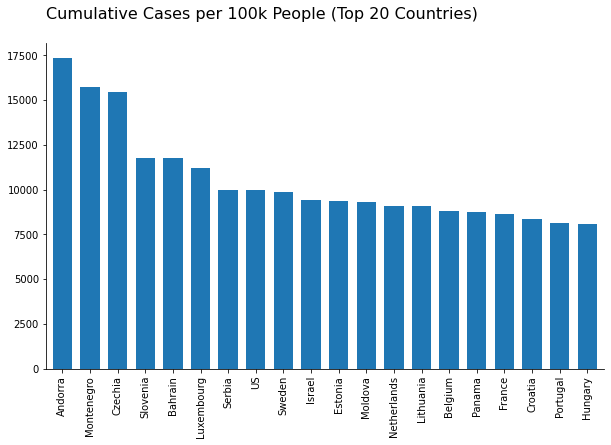

In [5]:
# plotting cases per 100k 
# source: https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb

ax1 = cases_pT.iloc[:, -1].sort_values(ascending=False).head(20).plot(kind='bar',width=0.7, figsize=(10,6))
ax1.set_title('Cumulative Cases per 100k People (Top 20 Countries)\n', fontsize=16, loc='left')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

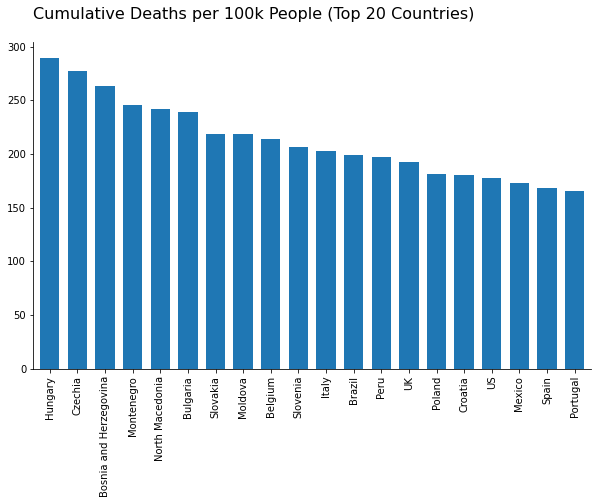

In [6]:
# plotting deaths per 100k
# source: https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb

deaths_pT.sort_values([cases.columns[-1]], ascending=False, axis=0, inplace=True)

ax = deaths_pT.iloc[:, -1].sort_values(ascending=False).head(20).plot(kind='bar',width=0.7, figsize=(10,6))
ax.set_title('Cumulative Deaths per 100k People (Top 20 Countries)\n', fontsize=16, loc='left')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
# plt.gca().invert_yaxis()
ax.xaxis.tick_bottom();

# K-Means on Cases vs. Deaths Data

                           cases      deaths  cluster
Afghanistan           164.536116    7.166610        0
Albania              4588.023344   83.938744        3
Algeria               292.393070    7.831217        0
Andorra             17353.193258  164.922214        2
Angola                 90.623874    2.018841        0
...                          ...         ...      ...
Vietnam                 3.234234    0.036634        0
West Bank and Gaza   6574.333122   72.793536        1
Yemen                  22.548407    4.438801        0
Zambia                529.892480    7.238433        0
Zimbabwe              265.932212   10.907944        0

[182 rows x 3 columns]


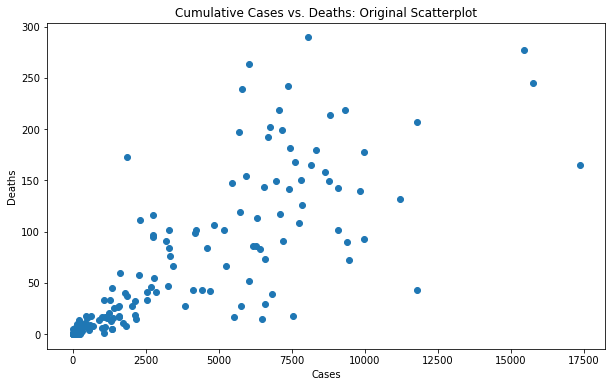

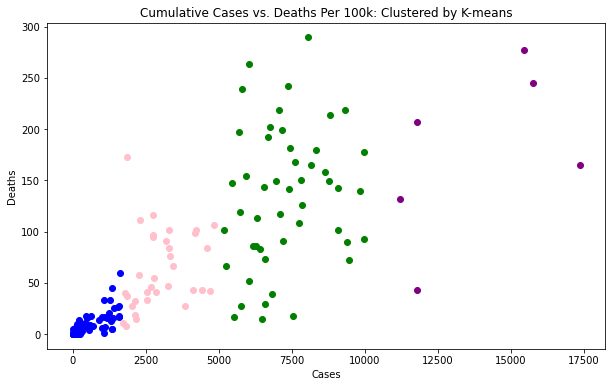

In [7]:
# training gaussian mixture model 
# source: https://www.analyticsvidhya.com/blog/2019/10/gaussian-mixture-models-clustering/

# making the data two-dimensional: comparing cases vs. deaths for each country on the last day (05-06-2021)
data = pd.DataFrame(cases_pT.iloc[:, -1])
data = data.sort_index()
data.columns = ['cases']

d = pd.DataFrame(deaths_pT.iloc[:, -1])
d = d.sort_index()
data['deaths'] = d['2021-05-06']

# original scatterplot
plt.figure(figsize=(10, 6))
plt.scatter(data['cases'], data['deaths'], marker='o');
plt.xlabel('Cases')
plt.title("Cumulative Cases vs. Deaths: Original Scatterplot")
plt.ylabel('Deaths')

kmeans = KMeans(n_clusters=4, random_state=0).fit(data)
frame1 = pd.DataFrame(data)
frame1['cluster'] = kmeans.labels_
frame1.columns = ['cases', 'deaths', 'cluster']
print(frame1)

# plotting the clusters
plt.figure(figsize=(10, 6))
color=['blue','green','purple', 'pink']
for k in range(0,4):
    data = frame1[frame1["cluster"]==k]
    plt.scatter(data['cases'],data['deaths'],c=color[k])
plt.xlabel('Cases')
plt.ylabel('Deaths')
plt.title("Cumulative Cases vs. Deaths Per 100k: Clustered by K-means")
plt.show()

# Gaussian Mixture Models on Cases vs. Deaths Data

                           cases      deaths  cluster
Afghanistan           164.536116    7.166610        0
Albania              4588.023344   83.938744        3
Algeria               292.393070    7.831217        0
Andorra             17353.193258  164.922214        2
Angola                 90.623874    2.018841        0
...                          ...         ...      ...
Vietnam                 3.234234    0.036634        0
West Bank and Gaza   6574.333122   72.793536        3
Yemen                  22.548407    4.438801        0
Zambia                529.892480    7.238433        1
Zimbabwe              265.932212   10.907944        1

[182 rows x 3 columns]


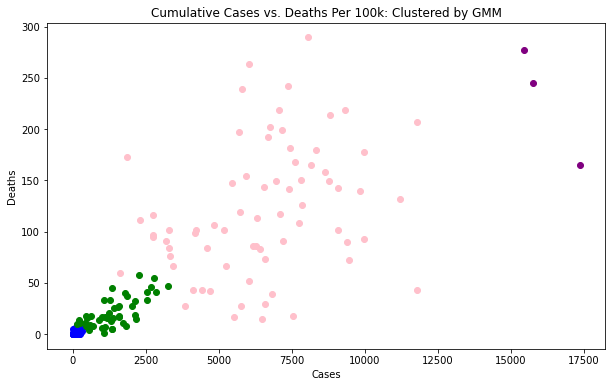

In [8]:
# training gaussian mixture model 
# source: https://www.analyticsvidhya.com/blog/2019/10/gaussian-mixture-models-clustering/

# making the data two-dimensional: comparing cases vs. deaths for each country on the last day (05-06-2021)
data = pd.DataFrame(cases_pT.iloc[:, -1])
data = data.sort_index()
data.columns = ['cases']
d = pd.DataFrame(deaths_pT.iloc[:, -1])
d = d.sort_index()
data['deaths'] = d['2021-05-06']

#predictions from gmm
gmm = GaussianMixture(n_components=4)
gmm.fit(data)
labels = gmm.predict(data)
frame = pd.DataFrame(data)
frame['cluster'] = labels
frame.columns = ['cases', 'deaths', 'cluster']
print(frame)

# plotting the clusters
plt.figure(figsize=(10, 6))
color=['blue','green','purple', 'pink']
for k in range(0,4):
    data = frame[frame["cluster"]==k]
    plt.scatter(data['cases'],data['deaths'],c=color[k])
plt.xlabel('Cases')
plt.ylabel('Deaths')
plt.title("Cumulative Cases vs. Deaths Per 100k: Clustered by GMM")
plt.show()

# plots show that GMM is probably better than k-means (which will return circular clusters)

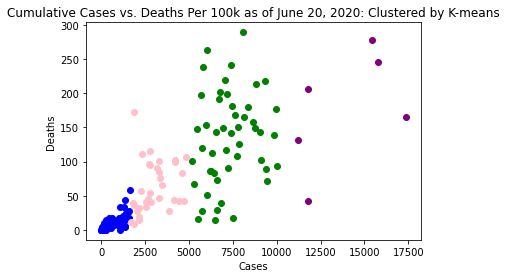

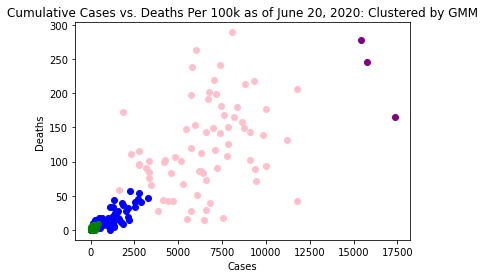

In [13]:
# plotting the clusters
color=['blue','green','purple', 'pink']
ksizes = []
knames = []
for k in range(no_clusters):
    data = frame1[frame1["cluster"]==k]
    ksizes.append(len(data))
    names = list(data.index)
    knames.append(names)
    plt.scatter(data['cases'],data['deaths'],c=color[k])
plt.xlabel('Cases')
plt.ylabel('Deaths')
plt.title("Cumulative Cases vs. Deaths Per 100k as of June 20, 2020: Clustered by K-means")
plt.show()

data = pd.DataFrame(cases_pT['5/6/2021'])
data = data.sort_index()
data.columns = ['cases']
data['deaths'] = deaths_pT['5/6/2021']

#predictions from gmm
gmm = GaussianMixture(n_components=no_clusters)
gmm.fit(data)
labels = gmm.predict(data)
frame = pd.DataFrame(data)
frame['cluster'] = labels
frame.columns = ['cases', 'deaths', 'cluster']
# print(frame)

# plotting the clusters
color=['blue','green','purple', 'pink']
gmmsizes = []
gmmnames = []
for k in range(no_clusters):
    data = frame[frame["cluster"]==k]
    gmmsizes.append(len(data))
    plt.scatter(data['cases'],data['deaths'],c=color[k])
    gmmnames.append(list(data.index))
plt.xlabel('Cases')
plt.ylabel('Deaths')
plt.title("Cumulative Cases vs. Deaths Per 100k as of June 20, 2020: Clustered by GMM")
plt.show()

# plots show that GMM is probably better than k-means (which will return circular clusters)

In [14]:
print(ksizes)
print(gmmsizes)

print(knames[1])
print(gmmnames[1])

diff = []
for name in knames[0]:
    if name not in gmmnames[0]:
        diff.append(name)

print(diff)

[94, 49, 6, 33]
[48, 60, 3, 71]
['Argentina', 'Armenia', 'Austria', 'Belgium', 'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cyprus', 'Estonia', 'France', 'Hungary', 'Ireland', 'Israel', 'Italy', 'Jordan', 'Kosovo', 'Kuwait', 'Latvia', 'Lebanon', 'Liechtenstein', 'Lithuania', 'Maldives', 'Malta', 'Moldova', 'Monaco', 'Netherlands', 'North Macedonia', 'Panama', 'Peru', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Serbia', 'Seychelles', 'Slovakia', 'Spain', 'Sweden', 'Switzerland', 'Turkey', 'UK', 'US', 'United Arab Emirates', 'Uruguay', 'West Bank and Gaza']
['Afghanistan', 'Algeria', 'Angola', 'Australia', 'Benin', 'Bhutan', 'Brunei', 'Burkina Faso', 'Burma', 'Burundi', 'Cambodia', 'Cameroon', 'Central African Republic', 'Chad', 'China', 'Congo (Brazzaville)', 'Congo (Kinshasa)', "Cote d'Ivoire", 'Dominica', 'Eritrea', 'Ethiopia', 'Fiji', 'Gambia', 'Ghana', 'Grenada', 'Guinea', 'Guinea-Bissau', 'Haiti', 'Kenya', 'Korea, South', 'Laos', 'Li

# Time Series K-Means Clustering: Cases per 100k

COVID-19 deaths vs time curves
44599.752 --> 34338.438 --> 33892.484 --> 33656.445 --> 33575.289 --> 33575.289 --> 
green cluster, N = 18
orange cluster, N = 9
red cluster, N = 38
blue cluster, N = 117


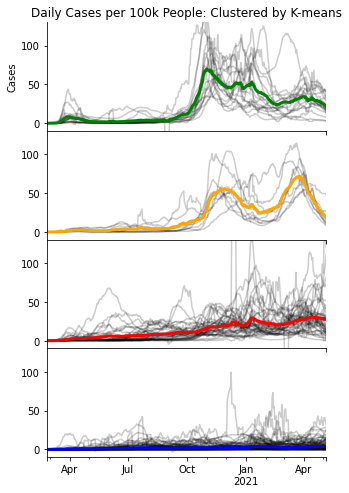

In [15]:
# 4 cluster version: cases per 100k

cluster = 4
df = cases_pT_new.iloc[:,35:]
X_train = df.rolling(7, axis=1, min_periods=1).mean().fillna(0)
colors = ['blue', 'red', 'orange', 'green']
names = ['blue cluster','red cluster','orange cluster', 'green cluster']
seed = 2
np.random.seed(seed)
X_train = to_time_series_dataset(X_train.copy())

print('COVID-19 deaths vs time curves')
km = TimeSeriesKMeans(n_clusters=cluster, verbose=True, random_state=seed,
                         max_iter=10)

y_pred = km.fit_predict(X_train)
clusters = pd.Series(data=y_pred, index=df.index)

f, (ax1, ax2, ax3, ax4) = plt.subplots(4, sharex=True, sharey=True,figsize=(5, 8))

for yi,cl,xs in zip(range(cluster),[3,2,1,0],[ax1,ax2,ax3,ax4]):
    data = df.rolling(7, axis=1, min_periods=1).mean().fillna(0).loc[clusters[clusters == cl].index]
    data.T.plot(legend=False, alpha=.2,color='black', ax=xs)
    data.mean(axis=0).plot(linewidth=3., color=colors[cl], ax=xs)
    n = len(data)
    print('{}, N = {}'.format(names[cl], n))

ax1.set_title("Daily Cases per 100k People: Clustered by K-means")
ax1.set_ylabel("Cases")
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['right'].set_visible(False)
# ax2.set_ylabel("Cases")
ax3.spines['right'].set_visible(False)
# ax3.set_ylabel("Cases")
ax4.spines['right'].set_visible(False)
# ax4.set_ylabel("Cases")

f.subplots_adjust(hspace=0)
plt.ylim(-10, 130)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)

In [16]:
# 4 cluster version: cases per 100k

world = Map(tiles='cartodbpositron')
from IPython.display import IFrame
opa = [0.99,0.99,0.99,0.5]
for name in coord.index:
    CircleMarker([coord.loc[name].lat, coord.loc[name].long],
                 popup=Popup(max_width=450).add_child(
                     Vega(coord.loc[name].json, width=450, height=250)),
                 color=colors[clusters.loc[name]],
                 radius=5,
                 fill=True,
                 opacity=opa[clusters.loc[name]]).add_to(world)
world

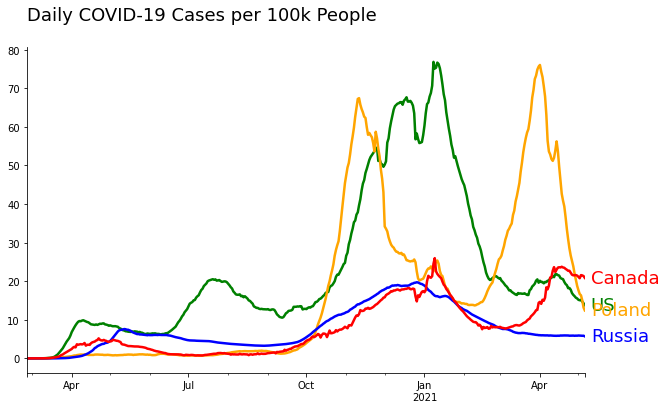

In [17]:
# 4 cluster version: cases per 100k

countries = ['US', 'Poland', 'Russia', 'Canada']
delay_days = 35
colors = ['green', 'orange', 'blue', 'red']
fig, ax2 = plt.subplots()
for country, col in zip(countries, colors):
    cases_pT_new.loc[country][delay_days:].rolling(7).mean().fillna(
        0).plot(kind='line',
                linewidth=2.5,
                label=country,
                figsize=(10, 6),
                color=col, ax=ax2)
ax2.set_title('Daily COVID-19 Cases per 100k People\n', fontsize=18, loc='left')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
for line, name, sett in zip(ax2.lines, countries, [0.07, 0, 0.0,0.0,0.0]):
    y = line.get_ydata()[-1]
    ax2.annotate(name,
                 xy=(1, y + sett),
                 xytext=(6, 0),
                 color=line.get_color(),
                 xycoords=ax2.get_yaxis_transform(),
                 textcoords="offset points",
                 size=18,
                 va="center")

# Time Series K-Means Clustering: Deaths per 100k

COVID-19 deaths vs time curves
17.301 --> 13.913 --> 13.391 --> 13.228 --> 13.228 --> 
orange cluster, N = 21
green cluster, N = 10
blue cluster, N = 124
red cluster, N = 27


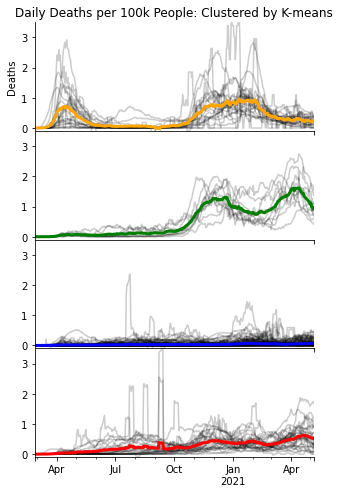

In [18]:
# 4 cluster version: deaths per 100k
# source: https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb

cluster = 4
df = deaths_pT_new.iloc[:,35:]
X_train = df.rolling(7, axis=1, min_periods=1).mean().fillna(0)
colors = ['red', 'blue', 'green', 'orange']
names = ['red cluster','blue cluster','green cluster', 'orange cluster']
seed = 22
np.random.seed(seed)
X_train = to_time_series_dataset(X_train.copy())

print('COVID-19 deaths vs time curves')
km = TimeSeriesKMeans(n_clusters=cluster, verbose=True, random_state=seed,
                         max_iter=10)

y_pred = km.fit_predict(X_train)
clusters = pd.Series(data=y_pred, index=df.index)

f, (ax1, ax2, ax3, ax4) = plt.subplots(4, sharex=True, sharey=True,figsize=(5, 8))

for yi,cl,xs in zip(range(cluster),[3,2,1,0],[ax1,ax2,ax3,ax4]):
    data = df.rolling(7, axis=1, min_periods=1).mean().fillna(0).loc[clusters[clusters == cl].index]
    data.T.plot(legend=False, alpha=.2,color='black', ax=xs)
    data.mean(axis=0).plot(linewidth=3., color=colors[cl], ax=xs)
    n = len(data)
    print('{}, N = {}'.format(names[cl], n))

ax1.set_title("Daily Deaths per 100k People: Clustered by K-means")
ax1.set_ylabel("Deaths")
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['right'].set_visible(False)
# ax2.set_ylabel("Deaths")
ax3.spines['right'].set_visible(False)
# ax3.set_ylabel("Deaths")
ax4.spines['right'].set_visible(False)
# ax4.set_ylabel("Deaths")

f.subplots_adjust(hspace=0)
plt.ylim(-0.1, 3.5)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)

In [19]:
# 4 cluster version: deaths per 100k
# source: https://nbviewer.jupyter.org/github/rbiele02/07_clustering_covid_time_series/blob/master/covid_clustering.ipynb

world = Map(tiles='cartodbpositron')
from IPython.display import IFrame
opa = [0.99,0.99,0.99,0.5]
for name in coord.index:
    CircleMarker([coord.loc[name].lat, coord.loc[name].long],
                 popup=Popup(max_width=450).add_child(
                     Vega(coord.loc[name].json, width=450, height=250)),
                 color=colors[clusters.loc[name]],
                 radius=5,
                 fill=True,
                 opacity=opa[clusters.loc[name]]).add_to(world)
world

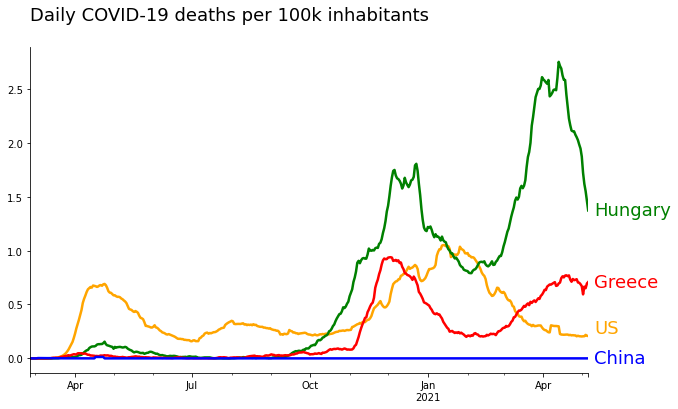

In [20]:
# 4 cluster version: deaths per 100k

countries = ['US','Hungary', 'Greece', 'China']
delay_days = 35
colors = ['orange', 'green', 'red', 'blue']
fig, ax2 = plt.subplots()
for country, col in zip(countries, colors):
    deaths_pT_new.loc[country][delay_days:].rolling(7).mean().fillna(
        0).plot(kind='line',
                linewidth=2.5,
                label=country,
                figsize=(10, 6),
                color=col, ax=ax2)
ax2.set_title('Daily COVID-19 deaths per 100k inhabitants\n', fontsize=18, loc='left')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
for line, name, sett in zip(ax2.lines, countries, [0.07, 0, 0.0,0.0,0.0]):
    y = line.get_ydata()[-1]
    ax2.annotate(name,
                 xy=(1, y + sett),
                 xytext=(6, 0),
                 color=line.get_color(),
                 xycoords=ax2.get_yaxis_transform(),
                 textcoords="offset points",
                 size=18,
                 va="center")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=ec16523d-cb13-40f0-bc10-e069e0fdaf88' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>